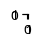

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 150
sns.set_style('darkgrid')
import os,sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import warnings
warnings.filterwarnings("ignore")
import glob
from tqdm.auto import tqdm
from datetime import datetime as dt
from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, add_median_labels, get_palette
from src.data_processing import BL62_VALUES, BL62FREQ_VALUES, HLAS, AA_KEYS
from src.utils import pkl_load, pkl_dump, get_palette
from src.torch_utils import save_checkpoint, load_checkpoint
from src.train_eval import predict_model, train_eval_loops
from src.models import FullTCRVAE
from src.metrics import reconstruction_accuracy, VAELoss, TripletLoss, CombinedVAELoss, compute_cosine_distance
from src.datasets import TCRSpecificDataset, FullTCRDataset
import torch
from torch import optim
from torch.utils.data import RandomSampler, SequentialSampler
from torch import nn
from torch.nn import functional as F
mpl.rcParams['figure.dpi'] = 180

In [2]:
# Load models together
from src.torch_utils import load_model_full
from src.metrics import compute_cosine_distance
from src.utils import get_class_initcode_keys
from src.models import BimodalVAEClassifier, FullTCRVAE, PeptideClassifier
from src.datasets import BimodalTCRpMHCDataset, FullTCRDataset, LatentTCRpMHCDataset, TCRSpecificDataset
from src.train_eval import predict_bimodal, predict_model
from torch.utils.data import SequentialSampler
from src.datasets import *
from src.models import *
pos_df = pd.read_csv('../data/filtered/230927_nettcr_positives_only.csv')
mix_df = pd.read_csv('../data/filtered/231205_nettcr_old_26pep_with_swaps.csv')


def get_model(folder):
    pt = glob.glob(folder+'/*.pt')[0]
    js = glob.glob(folder+'/*.json')[0]
    model = load_model_full(pt, js, return_json=False, verbose=False)
    return model
    

# do heatmap for retrained model

In [7]:
from src.datasets import BimodalTCRpMHCDataset
dataset_pep = FullTCRDataset(pos_df, 7, 8, 22, 6, 7, 23, 12, add_positional_encoding=True, encoding='BL50LO', pad_scale=-20)
dataset_tcr = FullTCRDataset(pos_df, 7, 8, 22, 6, 7, 23, 0, add_positional_encoding=False, encoding='BL50LO', pad_scale=-20)
loader_pep = dataset_pep.get_dataloader(1024, SequentialSampler)
loader_tcr = dataset_tcr.get_dataloader(1024, SequentialSampler)

# Doing a single model, validation fold, using cosine distance matrix

In [8]:
from src.sim_utils import make_dist_matrix, compute_cosine_distance
vae_ct = get_model('../output/240129_pepswapped/240122_PepSwapped_NormalFull_CosTrp_PosEncode_AddPep_LowMarg_fold_1_KFold_1_240126_1445_XXXXX/')
vae_nt = get_model('../output/240129_pepswapped/240122_PepSwapped_NormalFull_NoTrp_PosEncode_AddPep_LowMarg_fold_1_KFold_1_240126_1445_XXXXX/')
vae_tight = get_model('../output/240119_PosEnc_AddPep/240115_twostageFullTCR_WarmUpLowerMargin2Kepochs_KFold_1_240115_1401_TIGHT/').vae

preds_ct = predict_model(vae_ct, dataset_pep, loader_pep)
preds_nt = predict_model(vae_nt, dataset_pep, loader_pep)
preds_tight = predict_model(vae_tight, dataset_tcr, loader_tcr)

valid_ct = make_dist_matrix(preds_ct.query('partition==1'))
valid_nt = make_dist_matrix(preds_nt.query('partition==1'))
valid_tight = make_dist_matrix(preds_tight.query('partition==1'))

# retry some classic clustering methods on new computed distance matrices

In [167]:
from sklearn.cluster import KMeans, HDBSCAN, AgglomerativeClustering
from sklearn.metrics import calinski_harabasz_score as ch_score
from sklearn.metrics import davies_bouldin_score as db_score

features = preds_ct.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values

# High CH and low DB = good cluster
print(ch_score(features, pred), db_score(features, pred))
random = np.random.randint(0,150,len(pred))
print(ch_score(features, random), db_score(features, random))


47.82596448232042 3.0879978497489518
0.980234178413273 6.360854926708255


<Axes: >

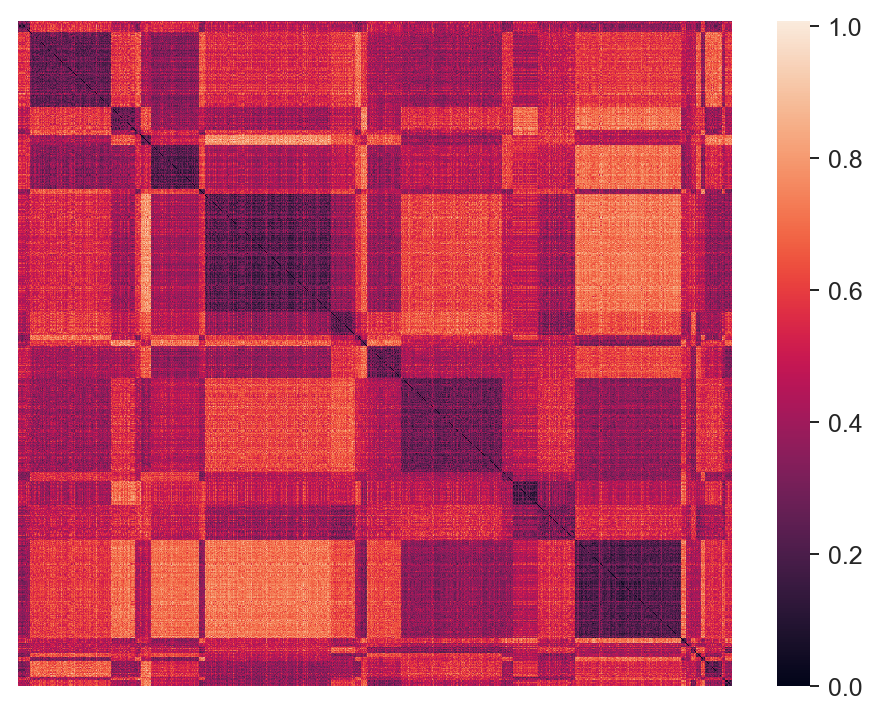

In [96]:
st= valid_ct.sort_values('peptide').drop(columns=['peptide','original_peptide'])
sns.heatmap(st[st.index], xticklabels=False, yticklabels=False)

<Axes: >

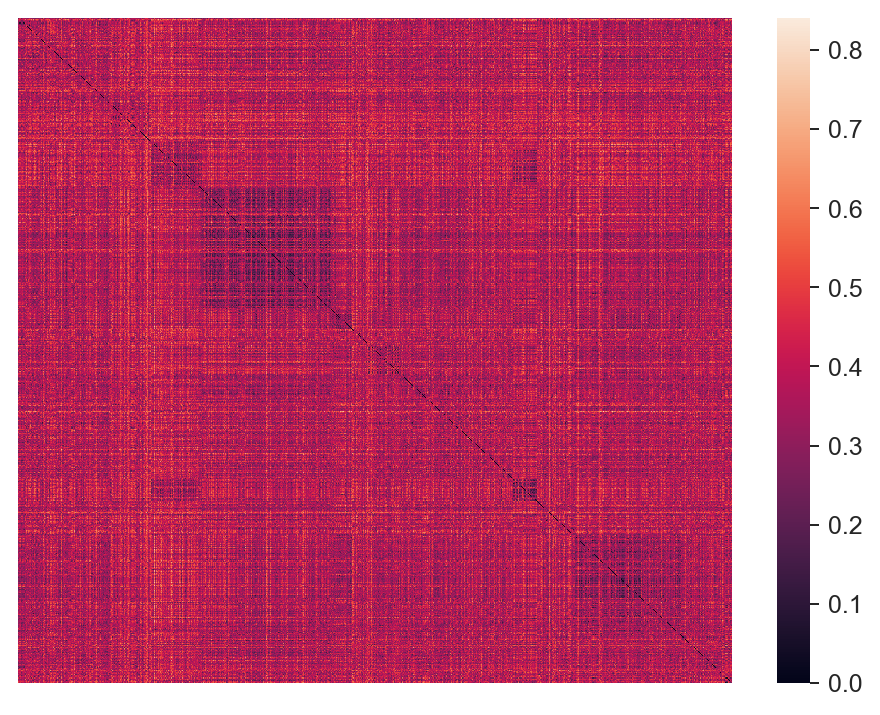

In [169]:
tight= valid_tight.sort_values('peptide').drop(columns=['peptide','original_peptide'])
sns.heatmap(tight[tight.index], xticklabels=False, yticklabels=False)

In [ ]:
hdb = HDBSCAN(min_cluster_size=2, metric='precomputed', cluster_selection_epsilon=0.13)
sample = valid_ct.copy()
pred = hdb.fit_predict(sample.drop(columns=['peptide','original_peptide']).values)
print(len(np.unique(pred)))
sample['pred_label'] = pred
gb = sample.groupby(['pred_label', 'peptide']).agg(count=('original_peptide','count'))
gb.query('pred_label!=-1')

In [192]:

features = preds_ct.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values

sample = valid_ct.copy()
results = []
for cl_size in [2,3,4,5,6,7,8]:
    for t in tqdm(np.linspace(0.08, 0.16, 100)):
        hdb = HDBSCAN(min_cluster_size=cl_size, metric='precomputed', cluster_selection_epsilon=t)
        pred = hdb.fit_predict(sample.drop(columns=['peptide','original_peptide']).values)
        results.append([cl_size, t, round(ch_score(features, pred),5), round(db_score(features, pred),5), 'HDBSCAN'])

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 27.84it/s]


## Agglo clustering

In [230]:
def get_linkage_matrix(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    return linkage_matrix



In [ ]:
features = preds_ct.query('partition==1')
features = features[[z for z in features.columns if z.startswith('z_')]].values
sample = valid_ct.copy()

for linkage in ['average', 'single', 'complete']:
    for t in tqdm(np.linspace(0.06, 0.5, 500)):
        clustering = AgglomerativeClustering(n_clusters=None, metric='precomputed', distance_threshold = t, linkage=linkage)
        predicted_hc = clustering.fit_predict(sample.drop(columns=['peptide', 'original_peptide']).values)
        try:
            ch = round(ch_score(features, predicted_hc),5)
        except ValueError:
            continue
        try:
            db = round(db_score(features, predicted_hc),5)
        except ValueError:
            continue
        
        results.append([linkage, t, ch, db, 'hierarchical'])

In [201]:
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import hmean
results = pd.DataFrame(results, columns = ['param1', 'threshold', 'CH_score', 'DB_score', 'method'])
mms = MinMaxScaler()
results['CH_scaled'] = mms.fit_transform(results['CH_score'].values.reshape((-1,1)))
results['DB_scaled_inv'] = 1+2.220446e-16-mms.fit_transform(results['DB_score'].values.reshape((-1,1)))
results['hmean'] = results.apply(lambda x: hmean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
results['mean'] = results.apply(lambda x: np.mean([x['CH_scaled'], x['DB_scaled_inv']]), axis=1)
display(results.sort_values('hmean', ascending=False).head(5))
display(results.sort_values('mean', ascending=False).head(5))

,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
1897,average,0.461202,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1894,average,0.458557,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1163,average,0.468257,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1162,average,0.467375,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1161,average,0.466493,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305


,param1,threshold,CH_score,DB_score,method,CH_scaled,DB_scaled_inv,hmean,mean
1893,average,0.457675,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1894,average,0.458557,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1157,average,0.462966,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1156,average,0.462084,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305
1155,average,0.461202,108.49863,1.80763,hierarchical,1.0,0.724611,0.840318,0.862305


In [202]:
results.DB_score.min(), results.CH_score.max()

(0.32239, 108.49863)

In [ ]:
agg

In [240]:
agg = AgglomerativeClustering(n_clusters=None, metric='precomputed', linkage='average', distance_threshold=0.457675 )
predicted_hc = agg.fit_predict(sample.drop(columns=['peptide', 'original_peptide']).values)#sample.sort_values('original_peptide').drop(columns=['peptide', 'original_peptide']).values))
print(len(np.unique(predicted_hc)))
linkage_matrix = get_linkage_matrix(agg)

5


In [247]:
preds_ct.query('partition==1').shape

(1271, 90)

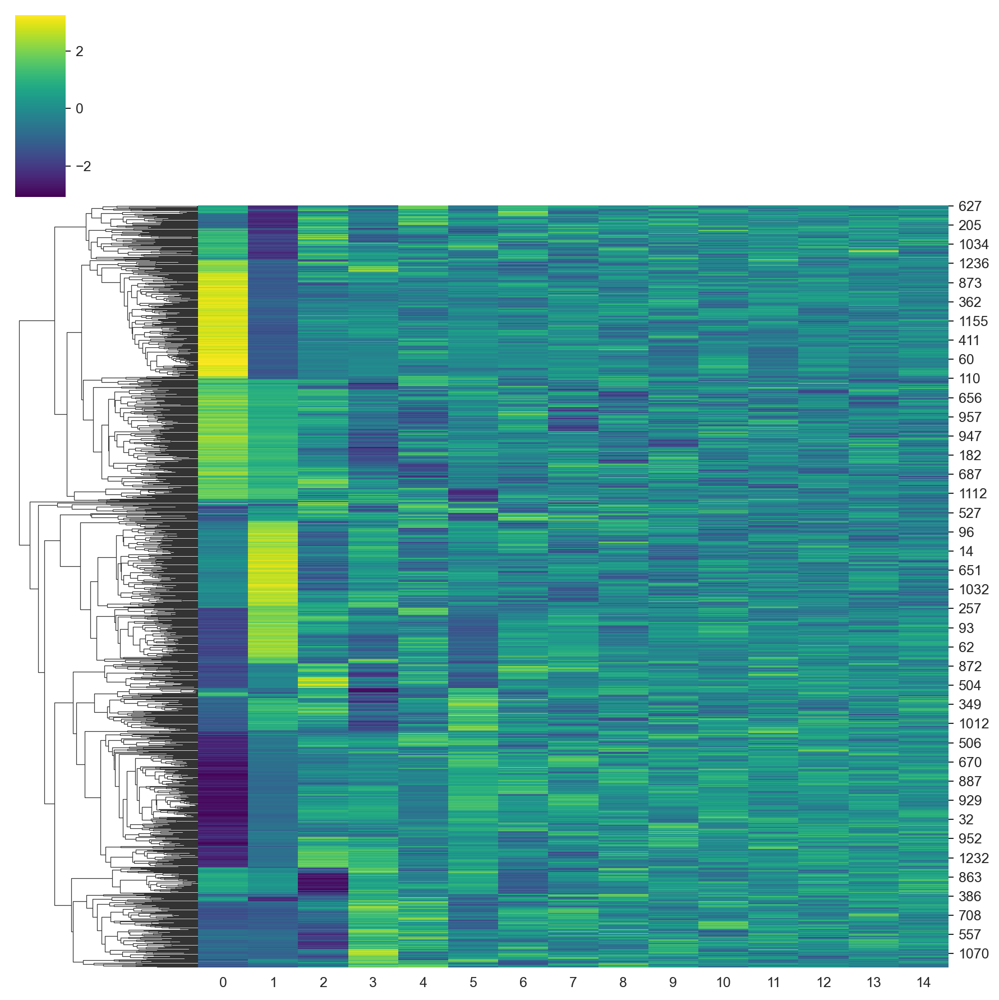

In [245]:
from sklearn.decomposition import PCA
features = preds_ct.query('partition==1')[[z for z in preds_ct.columns if z.startswith('z_')]+['peptide', 'original_peptide']]
pca = PCA(n_components=15)
pca_feats = pca.fit_transform(features.drop(columns=['peptide', 'original_peptide']).values)

sns.clustermap(pca_feats, col_cluster=False, row_linkage=linkage_matrix, cmap = 'viridis', z_score=0)

In [253]:
linkage_matrix

array([[4.04000000e+02, 9.05000000e+02, 3.32999229e-03, 2.00000000e+00],
       [2.78000000e+02, 3.02000000e+02, 5.19025326e-03, 2.00000000e+00],
       [1.36000000e+02, 1.16000000e+03, 5.93119860e-03, 2.00000000e+00],
       ...,
       [2.53400000e+03, 2.53700000e+03, 5.08180056e-01, 7.76000000e+02],
       [9.66000000e+02, 2.53800000e+03, 5.35025279e-01, 7.77000000e+02],
       [2.53600000e+03, 2.53900000e+03, 5.69117825e-01, 1.27100000e+03]])

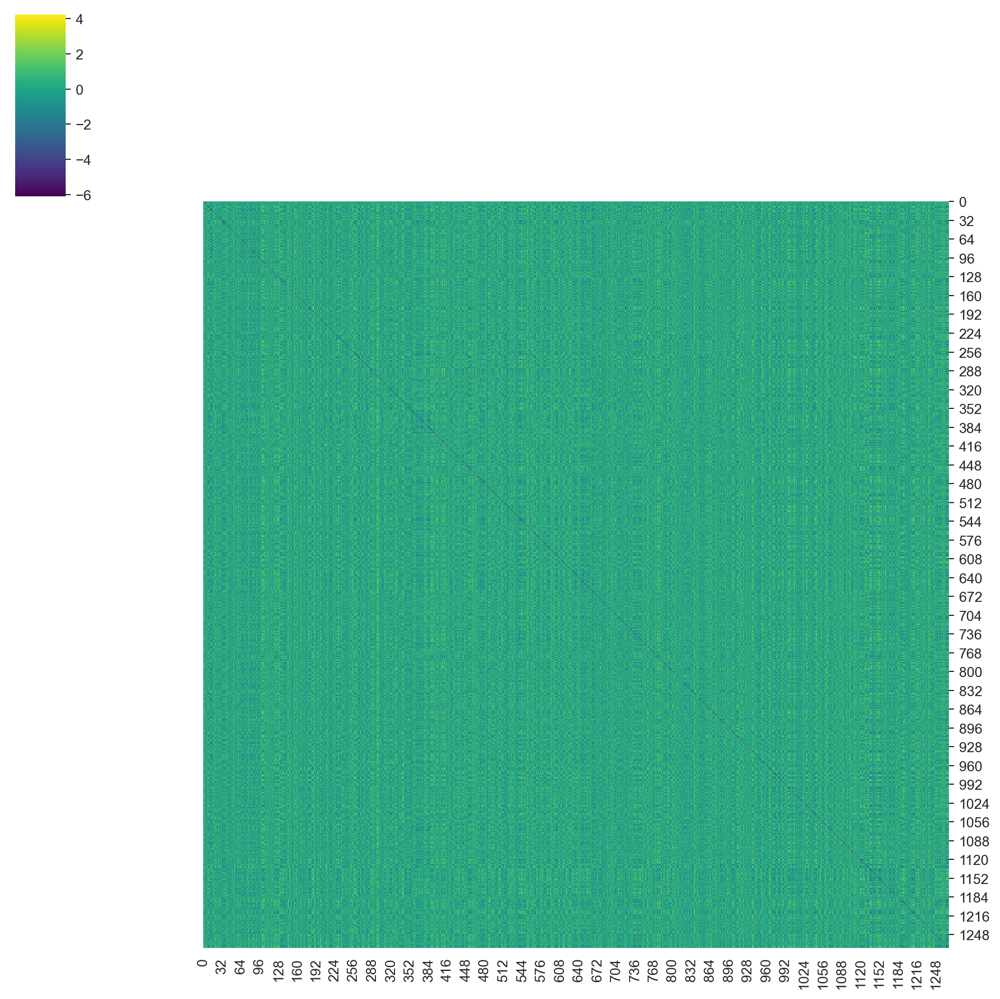

In [251]:
from sklearn.decomposition import PCA

sns.clustermap(valid_ct.drop(columns=['peptide', 'original_peptide']).values, col_cluster=False, row_linkage=linkage_matrix, col_linkage=linkage_matrix, cmap = 'viridis', z_score=0)

# custom algo tests

In [27]:
valid_ct.head(15)

,TRDTTYYRNSFDEQNAFLYNQGGKLISGHDYFNNNVPASSPGSRGNIQY,YGATPYYFSGDTLVAVGAPSTSGTYKYIMGHRAYSYEKLASSQDPGFGGGSYEQY,SSVPPYYTSAATLVAVKWSSNYKLTSQVTMANQGSEASVGSGDHGEQF,TRDTTYYRNSFDEQNALSEAGTGGSYIPTSGHTAFQGNSAASSGLEGAGDTQY,ATGYPSATKADDKALLNYGNNRLASGHVSFQNEAQASSLVRDRAYEQY,YGATPYYFSGDTLVAGPNNFGNEKLTMNHEYSMNVEVASSRGTGFNEQY,DSASNYIRSNVGEAARETSYDKVISGHNSFNNNVPASRKQGSDTGELF,SIFNTLYKAGELAGPSNTGKLIMGHRAYSYEKLAVLVDPYNEQF,DRGSQSIYSNGDAVNDQFYSGHNTYYREEEASSPGQLLMNTEAF,NSASDYIRSNMDKADMNRDDKIILNHDASQIVNDASSIRAAYEQY,...,SVFSSVVTGGEVAGGGSQGNLISGDLSYYNGEEASSYTGTEAF,DRGSQSIYSNGDAVNTGGNNRLALNHDASQIVNDASRGQPNTGELF,TSGFNGNVLDGLAVVANDYKLSMRHNASNTAGTASSDSIQSTDTQY,DSAIYNIQSSQRESPCKPEANNLFLNHDASQIVNDASSTHSGNQPQH,TTLSNLVKSGEVAGPIDGGSQGNLILNHDASQIVNDASSILSNQPQH,TSGFNGNVLDGLAVGSWGKLQLNHDASQIVNDASSARAGITQY,SVFSSVVTGGEVAGGGSQGNLILNHDASQIVNDASSARSTGELF,SIFNTLYKAGELAGQLAGGSQGNLILGHNAYSLEERASSQERGGKWAYEQY,peptide,original_peptide
TRDTTYYRNSFDEQNAFLYNQGGKLISGHDYFNNNVPASSPGSRGNIQY,0.000000,0.784137,0.137610,0.663871,0.534186,0.326519,0.143629,0.739271,0.820573,0.743524,...,0.762743,0.177001,0.698134,0.679102,0.768855,0.749163,0.741720,0.807450,RAKFKQLL,RAKFKQLL
YGATPYYFSGDTLVAVGAPSTSGTYKYIMGHRAYSYEKLASSQDPGFGGGSYEQY,0.784137,0.000000,0.756856,0.427292,0.542724,0.538621,0.682811,0.507270,0.496206,0.523435,...,0.581703,0.737662,0.550323,0.596369,0.546677,0.566334,0.547138,0.395543,RFPLTFGWCF,RFPLTFGWCF
SSVPPYYTSAATLVAVKWSSNYKLTSQVTMANQGSEASVGSGDHGEQF,0.137610,0.756856,0.000000,0.728749,0.585990,0.311027,0.149661,0.721121,0.785854,0.715927,...,0.732803,0.213607,0.767410,0.677302,0.712253,0.746001,0.744619,0.779751,RAKFKQLL,RAKFKQLL
TRDTTYYRNSFDEQNALSEAGTGGSYIPTSGHTAFQGNSAASSGLEGAGDTQY,0.663871,0.427292,0.728749,0.000000,0.491668,0.605103,0.693138,0.388690,0.636870,0.301318,...,0.386530,0.703025,0.271762,0.228248,0.281042,0.295792,0.370085,0.347262,GILGFVFTL,GILGFVFTL
ATGYPSATKADDKALLNYGNNRLASGHVSFQNEAQASSLVRDRAYEQY,0.534186,0.542724,0.585990,0.491668,0.000000,0.380810,0.547825,0.548606,0.366289,0.517833,...,0.474018,0.587299,0.512393,0.545336,0.512777,0.488006,0.511408,0.522410,AVFDRKSDAK,AVFDRKSDAK
YGATPYYFSGDTLVAGPNNFGNEKLTMNHEYSMNVEVASSRGTGFNEQY,0.326519,0.538621,0.311027,0.605103,0.380810,0.000000,0.326986,0.578583,0.494247,0.547787,...,0.598392,0.302316,0.626772,0.572913,0.567819,0.668983,0.593013,0.649893,KLGGALQAK,KLGGALQAK
DSASNYIRSNVGEAARETSYDKVISGHNSFNNNVPASRKQGSDTGELF,0.143629,0.682811,0.149661,0.693138,0.547825,0.326986,0.000000,0.683254,0.746673,0.682948,...,0.714772,0.164929,0.711241,0.668341,0.720118,0.727680,0.718690,0.722048,RAKFKQLL,RAKFKQLL
SIFNTLYKAGELAGPSNTGKLIMGHRAYSYEKLAVLVDPYNEQF,0.739271,0.507270,0.721121,0.388690,0.548606,0.578583,0.683254,0.000000,0.417121,0.149724,...,0.104748,0.700457,0.248542,0.221639,0.171124,0.257619,0.082034,0.232704,GILGFVFTL,GILGFVFTL
DRGSQSIYSNGDAVNDQFYSGHNTYYREEEASSPGQLLMNTEAF,0.820573,0.496206,0.785854,0.636870,0.366289,0.494247,0.746673,0.417121,0.000000,0.391289,...,0.448665,0.717966,0.388083,0.480427,0.548671,0.436705,0.426216,0.516804,ELAGIGILTV,ELAGIGILTV
NSASDYIRSNMDKADMNRDDKIILNHDASQIVNDASSIRAAYEQY,0.743524,0.523435,0.715927,0.301318,0.517833,0.547787,0.682948,0.149724,0.391289,0.000000,...,0.218120,0.656233,0.209942,0.154137,0.182723,0.169346,0.152139,0.280422,GILGFVFTL,GILGFVFTL


In [49]:
threshold = 0.2
sample = torch.from_numpy(valid_ct.head(25)[[x for i,x in enumerate(valid_ct.columns[:25])]].values)
sorted, indices = sample.sort(dim=1)
thresholded_dists = sorted[sorted<=threshold]
thresholded_idxs = indices[sorted<=threshold]

In [50]:
import torch

threshold = 0.2
sorted, indices = sample.sort(dim=1)

# Create a mask for values below the threshold
mask = sorted >= threshold

# Set values below the threshold to some arbitrary value (e.g., -1)
sorted.masked_fill_(mask, -1)
indices.masked_fill_(mask, -1)

# Get the thresholded distances and indices
thresholded_dists = sorted[sorted != -1]
thresholded_idxs = indices[indices != -1]

# Check the result
print(thresholded_dists)
print(thresholded_idxs)


tensor([0.0000, 0.1376, 0.1436, 0.0000, 0.0000, 0.1376, 0.1497, 0.0000, 0.0000,
        0.0000, 0.1571, 0.1745, 0.0000, 0.1436, 0.1497, 0.0000, 0.1497, 0.1674,
        0.0000, 0.0000, 0.1205, 0.1497, 0.0000, 0.0000, 0.1205, 0.1674, 0.0000,
        0.1404, 0.1745, 0.0000, 0.1493, 0.0000, 0.1493, 0.0000, 0.0000, 0.0494,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.1404, 0.1571, 0.0000, 0.0000,
        0.0494, 0.0000])
tensor([ 0,  2,  6,  1,  2,  0,  6,  3,  4,  5, 21, 12,  6,  0,  2,  7,  9, 11,
         8,  9, 11,  7, 10, 11,  9,  7, 12, 21,  5, 13, 14, 14, 13, 15, 16, 23,
        17, 18, 19, 20, 21, 12,  5, 22, 23, 16, 24])


In [51]:
indices

tensor([[ 0,  2,  6, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 2,  0,  6, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 3, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 4, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 5, 21, 12, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 6,  0,  2, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 7,  9, 11, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
         -1, -1, -1, -1, -1, -1, -1],
        [ 8, -1, -1, -1, -1, -1, -1, -1, -1, -1,

In [ ]:
# Define "intra_cluster_distance" threshold (cos dist)
# Define "inter_cluster_distance" threshold (cos dist)
# --> Defines a radius of in, a radius of out
# Pick "n_init" of random points ?

#
